In [16]:
import numpy as np
import pandas as pd
import riskfolio as rp
import math as math
from scipy import stats

pd.options.display.float_format = '{:.4%}'.format

df = pd.read_csv("newdata.csv")

# Pre-processing

In [19]:
# Setting the datetime index
df['date'] = pd.to_datetime(df['date'], format='%d/%m/%Y')
df = df.set_index('date')

In [21]:
# Generating % returns
df = df.dropna()
columns = list(df.columns)
columns_pct = []
for c in columns:
    df[c + "%"] = df[c].pct_change(fill_method=None)
    columns_pct.append(c + "%")

In [23]:
# Generating base and complemented portfolio returns
df1 = df[["stoxx%","eubond%"]].dropna()
df2 = df[["stoxx%","eubond%","euilbond%"]].dropna()
df1.columns=['Stocks','Nominal bonds']
df2.columns=['Stocks','Nominal bonds','IL bonds']

start_date = '2018-01-01'
end_date = '2023-12-31'
desc = df.loc[start_date:end_date, ["stoxx%", "eubond%", "euilbond%"]]

In [25]:
# Converting to monthly data
df1_m = df1.resample('M').agg(lambda x: (x + 1).prod() - 1)
df2_m = df2.resample('M').agg(lambda x: (x + 1).prod() - 1)
desc_m = desc.resample('M').agg(lambda x: (x + 1).prod() - 1)

In [27]:
# Correcting nominal returns for inflation
inflation = pd.read_csv("inflation_monthly.csv")
for c in columns_pct:
    df1_m[c] = (1 + df1_m[c]) / (1 + inflation) - 1
    df2_m[c] = (1 + df2_m[c]) / (1 + inflation) - 1

SyntaxError: unterminated string literal (detected at line 2) (2724104958.py, line 2)

# Descriptive statistics

In [30]:
# Generating covariance matrix
cov=rp.covar_matrix(df2_m.iloc[:], method='ewma1', d=0.94)
cov

,Stocks,Nominal bonds,IL bonds
Stocks,0.1888%,0.0559%,0.0778%
Nominal bonds,0.0559%,0.0511%,0.0489%
IL bonds,0.0778%,0.0489%,0.0644%


In [32]:
# Generatint annualized returns & StDev
import math as math
print("Annualized returns:\n")
print((desc_m.iloc[:].mean()+1)**12 - 1)

print("\nAnnualized StDev:\n")
print(desc_m.iloc[:].std()*math.sqrt(12))

print("\nVaR99%:\n")
desc_m.iloc[:].quantile(0.01)



Annualized returns:

stoxx%       4.7936%
eubond%     -0.7420%
euilbond%    2.0081%
dtype: float64

Annualized StDev:

stoxx%      15.6929%
eubond%      6.0625%
euilbond%    7.4236%
dtype: float64

VaR99%:



stoxx%      -10.3524%
eubond%      -4.6405%
euilbond%    -6.3138%
Name: 0.01, dtype: float64

In [34]:
# Generating correaltion table with significance levels
def correlation_with_significance(desc_m):
    # Calculate the correlation matrix
    corr = desc_m.corr()
    
    # Calculate the p-values
    p_values = pd.DataFrame(np.zeros((desc_m.shape[1], desc_m.shape[1])), columns=desc_m.columns, index=desc_m.columns)
    for row in desc_m.columns:
        for col in desc_m.columns:
            if row == col:
                p_values.loc[row, col] = np.nan
            else:
                p_values.loc[row, col] = stats.pearsonr(desc_m[row], desc_m[col])[1]
    
    return corr, p_values

corr_matrix, p_values_matrix = correlation_with_significance(desc_m)

# Combine the correlation matrix and p-values into a single DataFrame
significance_matrix = corr_matrix.copy()

for row in corr_matrix.columns:
    for col in corr_matrix.columns:
        significance_matrix.loc[row, col] = f"{corr_matrix.loc[row, col]:.2f} (p={p_values_matrix.loc[row, col]:.3f})"

print(significance_matrix)

                   stoxx%         eubond%       euilbond%
stoxx%       1.00 (p=nan)  0.35 (p=0.002)  0.58 (p=0.000)
eubond%    0.35 (p=0.002)    1.00 (p=nan)  0.81 (p=0.000)
euilbond%  0.58 (p=0.000)  0.81 (p=0.000)    1.00 (p=nan)


/var/folders/qz/8h7nst5x0l56m4lbqnldql1c0000gn/T/ipykernel_50956/2323801168.py:24: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '1.00 (p=nan)' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  significance_matrix.loc[row, col] = f"{corr_matrix.loc[row, col]:.2f} (p={p_values_matrix.loc[row, col]:.3f})"
/var/folders/qz/8h7nst5x0l56m4lbqnldql1c0000gn/T/ipykernel_50956/2323801168.py:24: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '0.35 (p=0.002)' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  significance_matrix.loc[row, col] = f"{corr_matrix.loc[row, col]:.2f} (p={p_values_matrix.loc[row, col]:.3f})"
/var/folders/qz/8h7nst5x0l56m4lbqnldql1c0000gn/T/ipykernel_50956/2323801168.py:24: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise

## Plotting returns

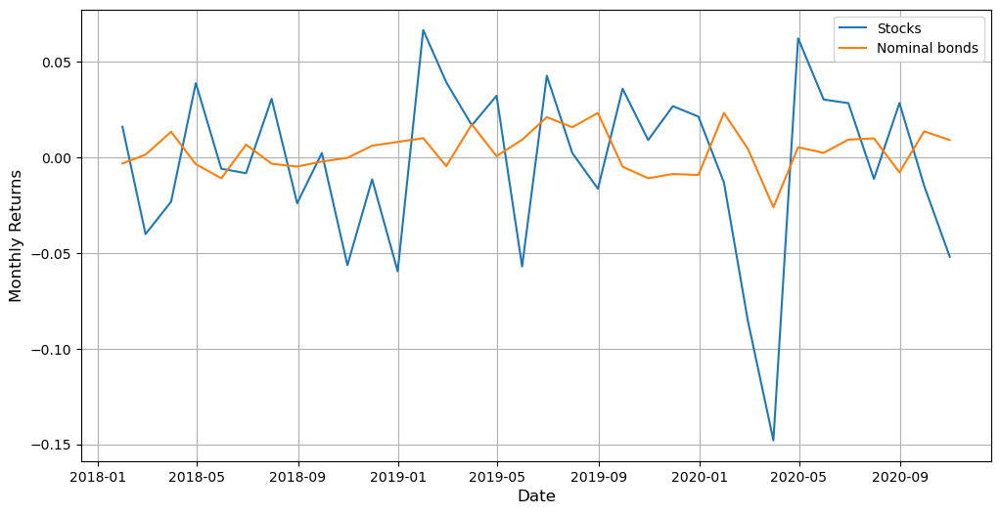

In [37]:
# Plotting monthly returns
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 6))
plt.plot(df2_m[['Stocks',"Nominal bonds"]].iloc[96:130], linestyle='-',label=['Stocks','Nominal bonds'])
plt.title('')
plt.xlabel('Date',size=12)
plt.ylabel('Monthly Returns',size=12)
plt.legend()
plt.grid(True)
plt.show()

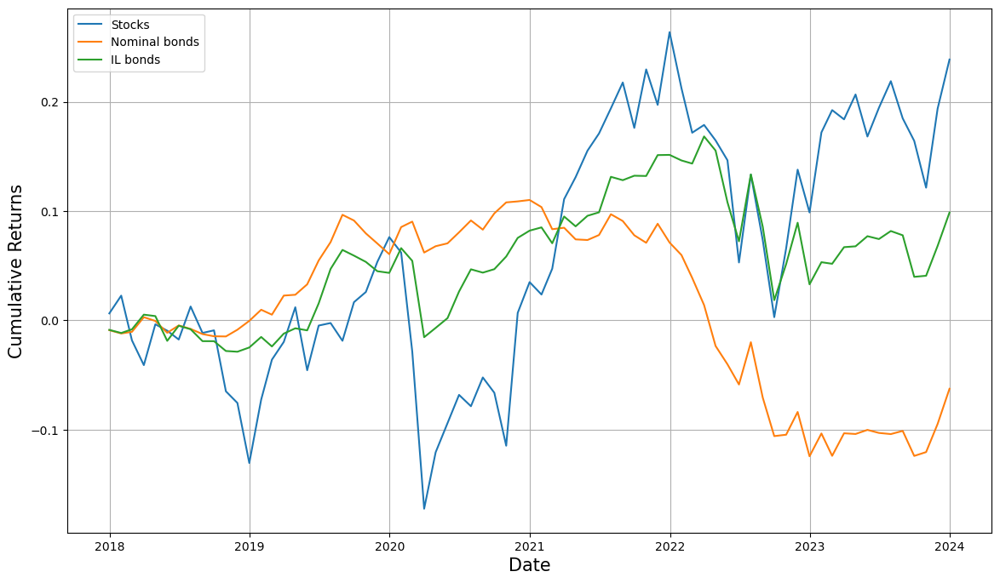

In [39]:
cumulative_returns = (1 + df2_m[95:]).cumprod() - 1

# Plot the cumulative returns
plt.figure(figsize=(14, 8))  # Set the plot size

for column in cumulative_returns.columns:
    plt.plot(cumulative_returns.index, cumulative_returns[column], linestyle='-', label=column)

plt.title('')
plt.xlabel('Date',size=15)
plt.ylabel('Cumulative Returns',size=15)
plt.grid(True)
plt.legend()  # Add the legend
plt.show()

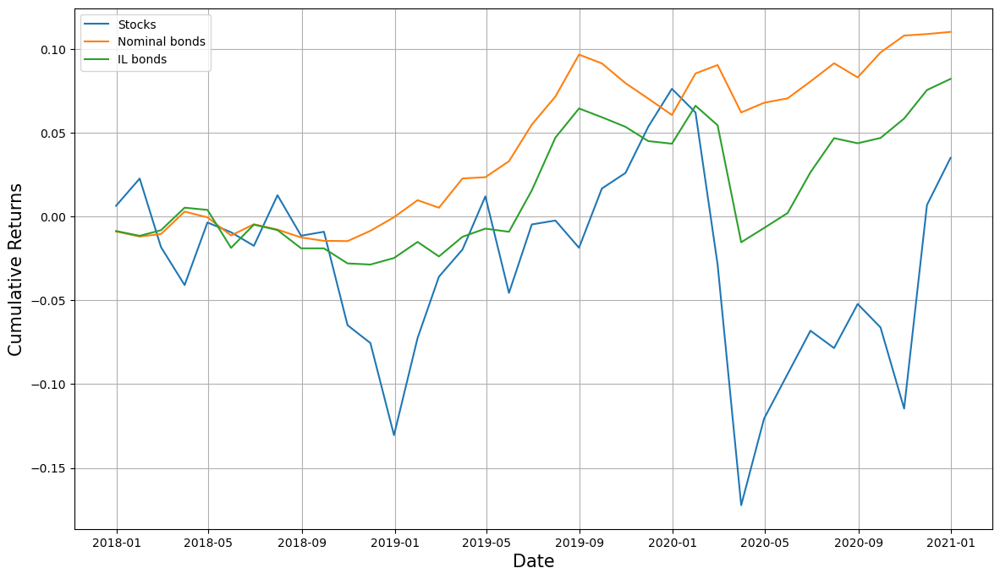

In [41]:
cumulative_returns = (1 + df2_m[95:132]).cumprod() - 1

# Plot the cumulative returns
plt.figure(figsize=(14, 8))  # Set the plot size

for column in cumulative_returns.columns:
    plt.plot(cumulative_returns.index, cumulative_returns[column], linestyle='-', label=column)

plt.title('')
plt.xlabel('Date',size=15)
plt.ylabel('Cumulative Returns',size=15)
plt.grid(True)
plt.legend()  # Add the legend
plt.show()

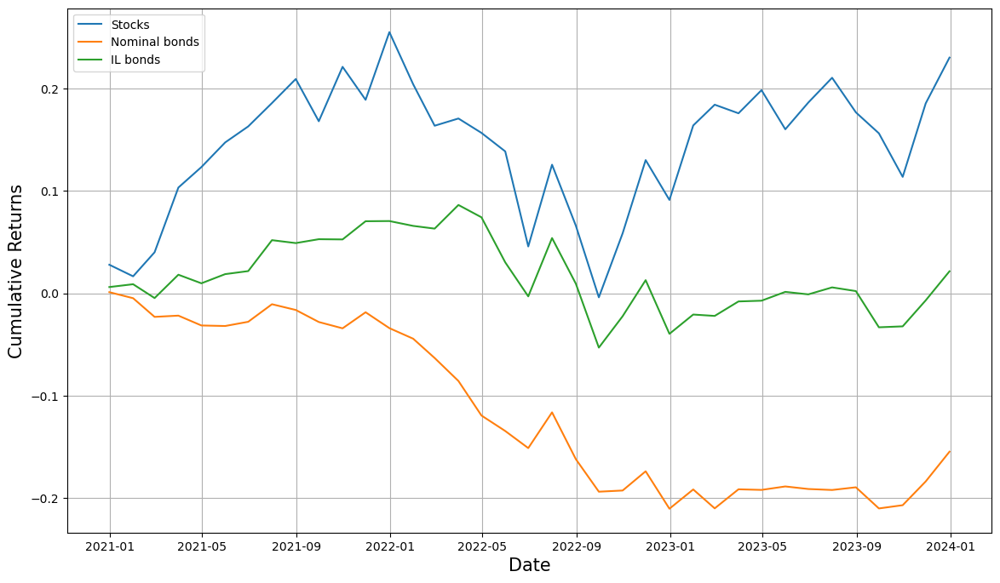

In [43]:
cumulative_returns = (1 + df2_m[131:]).cumprod() - 1

# Plot the cumulative returns
plt.figure(figsize=(14, 8))  # Set the plot size

for column in cumulative_returns.columns:
    plt.plot(cumulative_returns.index, cumulative_returns[column], linestyle='-', label=column)

plt.title('')
plt.xlabel('Date',size=15)
plt.ylabel('Cumulative Returns',size=15)
plt.grid(True)
plt.legend()  # Add the legend
plt.show()

# MV Optimization

## Base portfolio

### 2018-2020

,Stocks,Nominal bonds
weights,7.8927%,92.1073%


                                     CVXPY                                     
                                     v1.4.3                                    
(CVXPY) Jun 21 11:17:38 AM: Your problem has 396 variables, 4 constraints, and 0 parameters.
(CVXPY) Jun 21 11:17:38 AM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Jun 21 11:17:38 AM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Jun 21 11:17:38 AM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
(CVXPY) Jun 21 11:17:38 AM: Your problem is compiled with the CPP canonicalization backend.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Jun 21 11:17:38 AM: Compiling problem (target solver=MOSEK).
(C

/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:750: UserWarning: The figure layout has changed to tight
  fig.tight_layout()
/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:1324: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


                                     CVXPY                                     
                                     v1.4.3                                    
(CVXPY) Jun 21 11:17:39 AM: Your problem has 396 variables, 4 constraints, and 0 parameters.
(CVXPY) Jun 21 11:17:39 AM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Jun 21 11:17:39 AM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Jun 21 11:17:39 AM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
(CVXPY) Jun 21 11:17:39 AM: Your problem is compiled with the CPP canonicalization backend.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Jun 21 11:17:39 AM: Compiling problem (target solver=MOSEK).
(C

/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:1834: UserWarning: The figure layout has changed to tight
  fig.tight_layout()
/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:2225: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


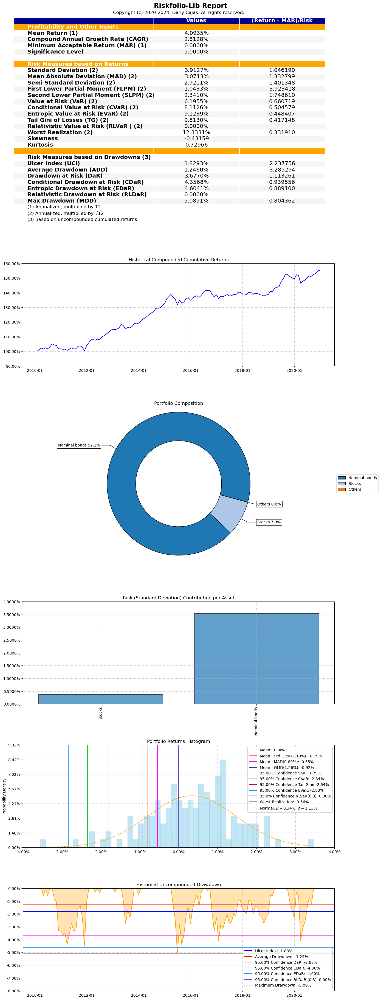

In [48]:
returns = df1_m.iloc[:132]
port = rp.Portfolio(returns)

method_mu='hist' # Method to estimate expected returns based on historical data.
method_cov='hist' # Method to estimate covariance matrix based on historical data.

port.assets_stats(method_mu=method_mu, method_cov=method_cov, d=0.94)

model='Classic'
rm = 'MV' # Risk measure
obj = 'Sharpe' # Objective function, MinRisk, MaxRet, Utility or Sharpe
hist = True
rf = 0 # Risk free rate
l = 0 # Risk aversion factor

w = port.optimization(model=model, rm=rm, obj=obj, rf=rf, l=l, hist=hist)
mv_base_18 = w

display(w.T)

ax = rp.jupyter_report(returns,
                       w,
                       rm=rm,
                       rf=rf,
                       alpha=0.05,
                       others=0.05,
                       nrow=25,
                       height=6,
                       width=14,
                       t_factor=12,
                       ini_days=21,
                       days_per_year=252,
                       bins=50,
                       solver='ECOS',
                       )

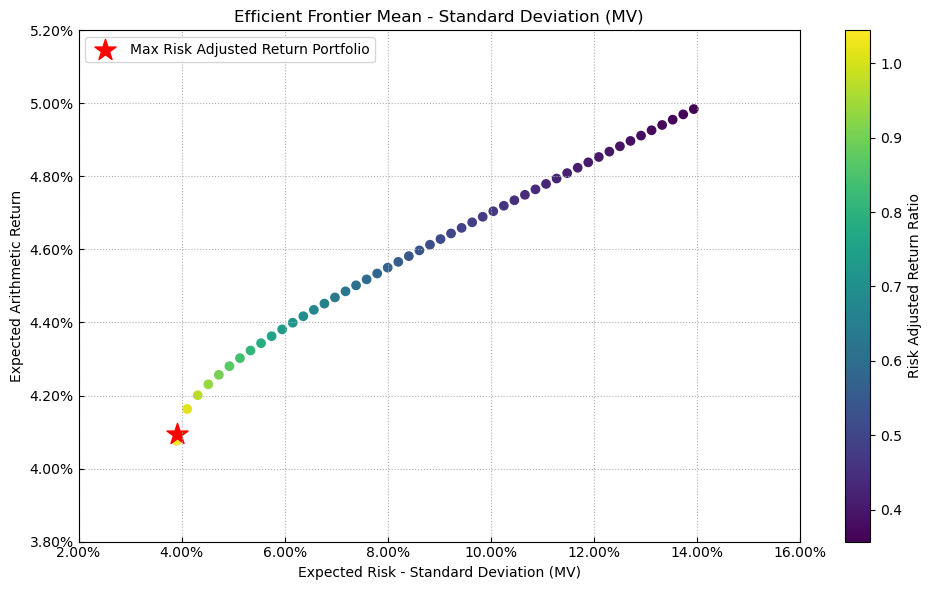

In [50]:
# Generating the efficient frontier
points = 50 # Number of points of the frontier

frontier = port.efficient_frontier(model=model, rm=rm, points=points, rf=rf, hist=hist)

label = 'Max Risk Adjusted Return Portfolio' # Title of point
mu = port.mu # Expected returns
cov = port.cov # Covariance matrix
returns = port.returns # Returns of the assets

ax = rp.plot_frontier(w_frontier=frontier, mu=mu, cov=cov, returns=returns, rm=rm,
                      rf=rf, alpha=0.05, cmap='viridis', w=w, label=label,
                      marker='*', s=16, c='r', height=6, width=10, ax=None, t_factor=12)

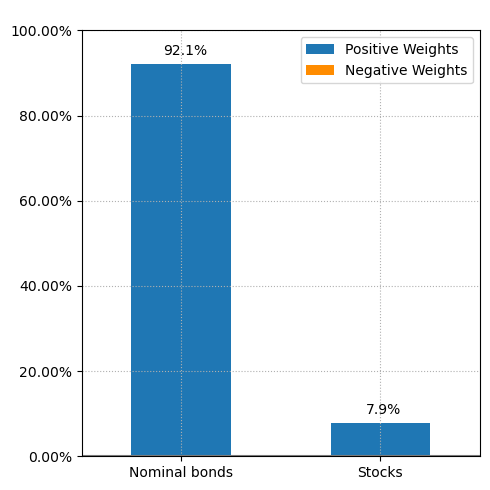

In [52]:
# Plotting portfolio weights
ax = rp.plot_bar(w,
                 title=' ',
                 kind="v",
                 others=0.05,
                 nrow=25,
                 height=5,
                 width=5,
                 cpos='tab:blue',
                 ax=None)

### 2020-2023

,Stocks,Nominal bonds
weights,25.9802%,74.0198%


                                     CVXPY                                     
                                     v1.4.3                                    
(CVXPY) Jun 21 11:17:45 AM: Your problem has 504 variables, 4 constraints, and 0 parameters.
(CVXPY) Jun 21 11:17:45 AM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Jun 21 11:17:45 AM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Jun 21 11:17:45 AM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
(CVXPY) Jun 21 11:17:45 AM: Your problem is compiled with the CPP canonicalization backend.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Jun 21 11:17:45 AM: Compiling problem (target solver=MOSEK).
(C

/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:750: UserWarning: The figure layout has changed to tight
  fig.tight_layout()
/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:1324: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


                                     CVXPY                                     
                                     v1.4.3                                    
(CVXPY) Jun 21 11:17:46 AM: Your problem has 504 variables, 4 constraints, and 0 parameters.
(CVXPY) Jun 21 11:17:46 AM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Jun 21 11:17:46 AM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Jun 21 11:17:46 AM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
(CVXPY) Jun 21 11:17:46 AM: Your problem is compiled with the CPP canonicalization backend.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Jun 21 11:17:46 AM: Compiling problem (target solver=MOSEK).
(C

/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:1834: UserWarning: The figure layout has changed to tight
  fig.tight_layout()
/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:2225: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


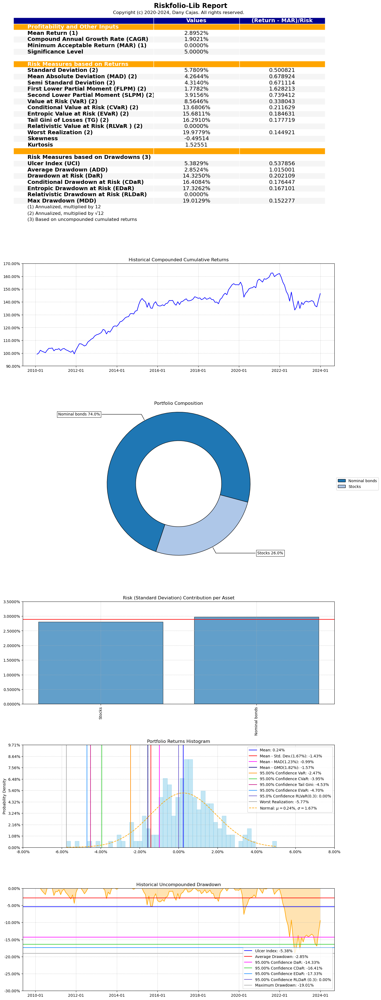

In [55]:
returns = df1_m.iloc[:]
port = rp.Portfolio(returns)

method_mu='hist' # Method to estimate expected returns based on historical data.
method_cov='hist' # Method to estimate covariance matrix based on historical data.

port.assets_stats(method_mu=method_mu, method_cov=method_cov, d=0.94)

model='Classic'
rm = 'MV' # Risk measure
obj = 'Sharpe' # Objective function, MinRisk, MaxRet, Utility or Sharpe
hist = True
rf = 0 # Risk free rate
l = 0 # Risk aversion factor

w = port.optimization(model=model, rm=rm, obj=obj, rf=rf, l=l, hist=hist)
mv_base_20 = w

display(w.T)

returns = port.returns

ax = rp.jupyter_report(returns,
                       w,
                       rm=rm,
                       rf=rf,
                       alpha=0.05,
                       others=1,
                       nrow=25,
                       height=6,
                       width=14,
                       t_factor=12,
                       ini_days=21,
                       days_per_year=252,
                       bins=50,
                       solver='ECOS',
                       )

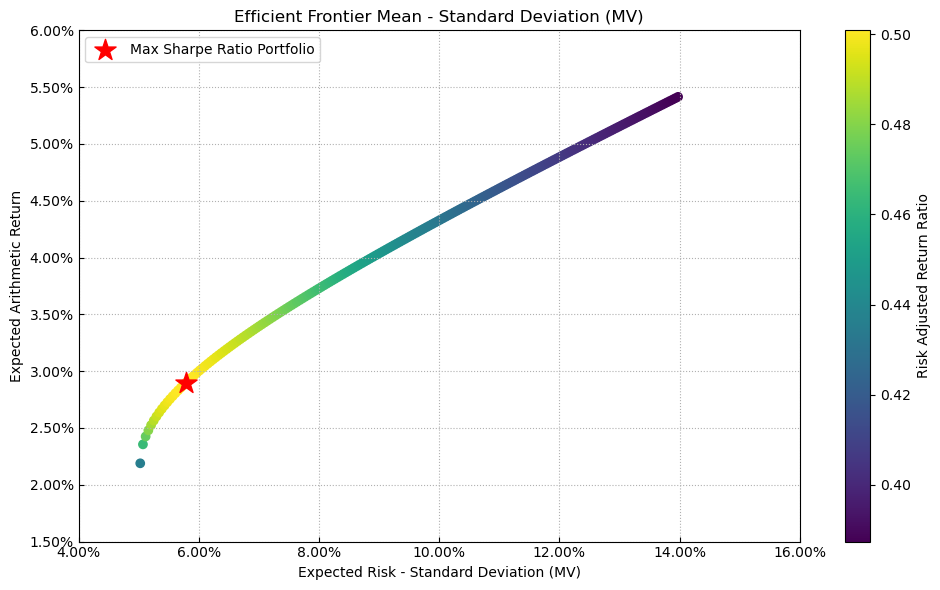

In [56]:
points = 200 # Number of points of the frontier

frontier = port.efficient_frontier(model=model, rm=rm, points=points, rf=rf, hist=hist)

label = 'Max Sharpe Ratio Portfolio' # Title of point
mu = port.mu # Expected returns
cov = port.cov # Covariance matrix
returns = port.returns # Returns of the assets

ax = rp.plot_frontier(w_frontier=frontier, mu=mu, cov=cov, returns=returns, rm=rm,
                      rf=rf, alpha=0.05, cmap='viridis', w=w, label=label,
                      marker='*', s=16, c='r', height=6, width=10, ax=None, t_factor=12)

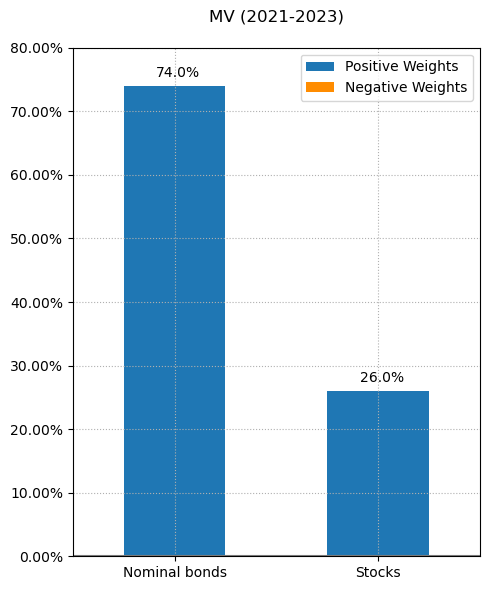

In [58]:
ax = rp.plot_bar(w,
                 title='MV (2021-2023)\n',
                 kind="v",
                 others=0.05,
                 nrow=25,
                 height=6,
                 width=5,
                 ax=None,
                 cpos='tab:blue')

## Base + ILB

### 2018-2020

,Stocks,Nominal bonds,IL bonds
weights,7.8927%,92.1073%,0.0000%


                                     CVXPY                                     
                                     v1.4.3                                    
(CVXPY) Jun 21 11:17:56 AM: Your problem has 396 variables, 4 constraints, and 0 parameters.
(CVXPY) Jun 21 11:17:56 AM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Jun 21 11:17:56 AM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Jun 21 11:17:56 AM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
(CVXPY) Jun 21 11:17:56 AM: Your problem is compiled with the CPP canonicalization backend.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Jun 21 11:17:56 AM: Compiling problem (target solver=MOSEK).
(C

/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:750: UserWarning: The figure layout has changed to tight
  fig.tight_layout()
/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:1324: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


                                     CVXPY                                     
                                     v1.4.3                                    
(CVXPY) Jun 21 11:17:56 AM: Your problem has 396 variables, 4 constraints, and 0 parameters.
(CVXPY) Jun 21 11:17:56 AM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Jun 21 11:17:56 AM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Jun 21 11:17:56 AM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
(CVXPY) Jun 21 11:17:56 AM: Your problem is compiled with the CPP canonicalization backend.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Jun 21 11:17:56 AM: Compiling problem (target solver=MOSEK).
(C

/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:1834: UserWarning: The figure layout has changed to tight
  fig.tight_layout()
/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:2225: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


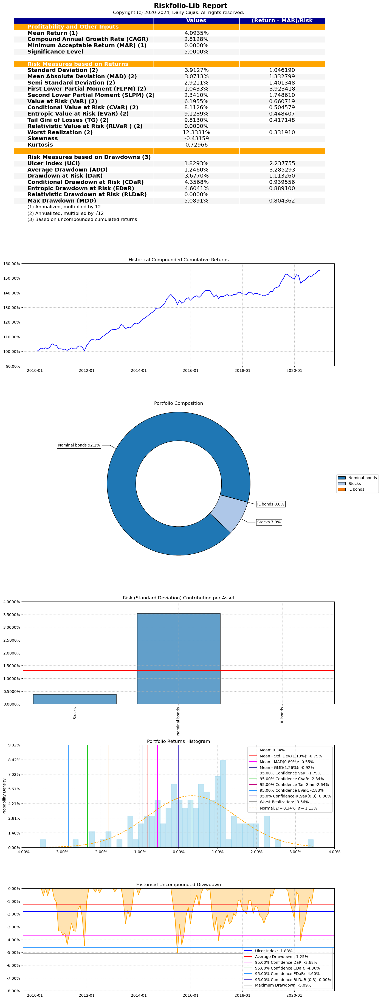

In [63]:
returns=df2_m.iloc[:132]
port = rp.Portfolio(returns)

method_mu='hist' # Method to estimate expected returns based on historical data.
method_cov='hist' # Method to estimate covariance matrix based on historical data.

port.assets_stats(method_mu=method_mu, method_cov=method_cov, d=0.94)

model='Classic'
rm = 'MV' # Risk measure
obj = 'Sharpe' # Objective function, MinRisk, MaxRet, Utility or Sharpe
hist = True
rf = 0 # Risk free rate
l = 0 # Risk aversion factor

w = port.optimization(model=model, rm=rm, obj=obj, rf=rf, l=l, hist=hist)
mv_ilb_18 = w

display(w.T)

ax = rp.jupyter_report(returns,
                       w,
                       rm=rm,
                       rf=rf,
                       alpha=0.05,
                       others=1,
                       nrow=25,
                       height=6,
                       width=14,
                       t_factor=12,
                       ini_days=21,
                       days_per_year=252,
                       bins=50,
                       solver='ECOS',
                       )

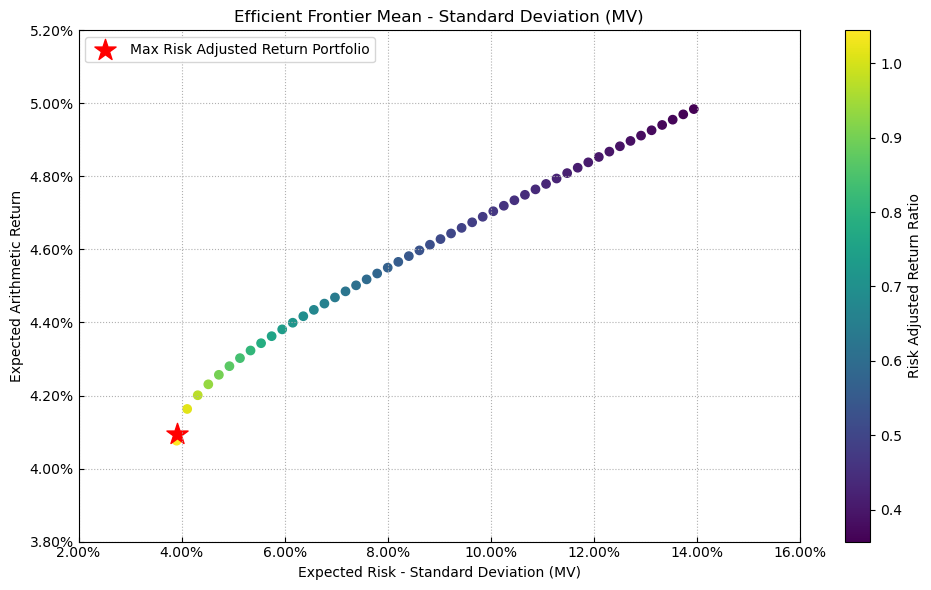

In [65]:
points = 50 # Number of points of the frontier

frontier = port.efficient_frontier(model=model, rm=rm, points=points, rf=rf, hist=hist)

label = 'Max Risk Adjusted Return Portfolio' # Title of point
mu = port.mu # Expected returns
cov = port.cov # Covariance matrix
returns = port.returns # Returns of the assets

ax = rp.plot_frontier(w_frontier=frontier, mu=mu, cov=cov, returns=returns, rm=rm,
                      rf=rf, alpha=0.05, cmap='viridis', w=w, label=label,
                      marker='*', s=16, c='r', height=6, width=10, ax=None, t_factor=12)

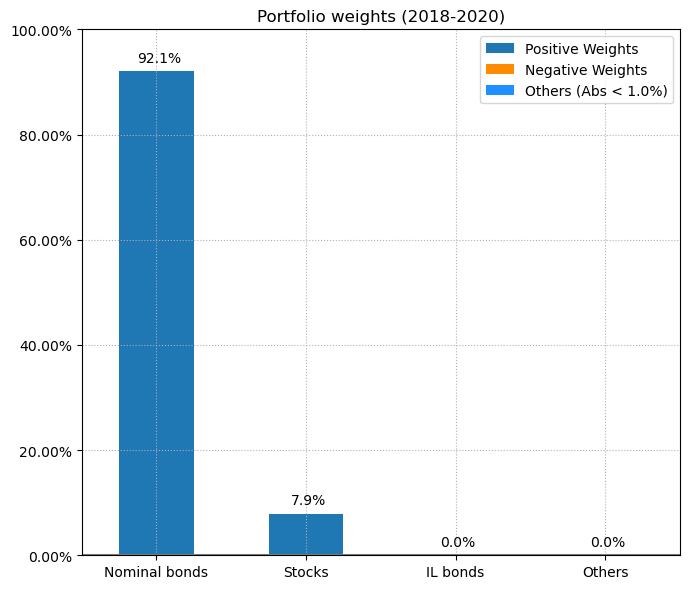

In [67]:
ax = rp.plot_bar(w,
                 title='Portfolio weights (2018-2020)',
                 kind="v",
                 
                 nrow=25,
                 height=6,
                 width=7,
                 cpos='tab:blue',
                 ax=None)

### 2020-2023

,Stocks,Nominal bonds,IL bonds
weights,24.0773%,62.4914%,13.4312%


                                     CVXPY                                     
                                     v1.4.3                                    
(CVXPY) Jun 21 11:18:02 AM: Your problem has 504 variables, 4 constraints, and 0 parameters.
(CVXPY) Jun 21 11:18:02 AM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Jun 21 11:18:02 AM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Jun 21 11:18:02 AM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
(CVXPY) Jun 21 11:18:02 AM: Your problem is compiled with the CPP canonicalization backend.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Jun 21 11:18:02 AM: Compiling problem (target solver=MOSEK).
(C

/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:750: UserWarning: The figure layout has changed to tight
  fig.tight_layout()
/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:1324: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


                                     CVXPY                                     
                                     v1.4.3                                    
(CVXPY) Jun 21 11:18:02 AM: Your problem has 504 variables, 4 constraints, and 0 parameters.
(CVXPY) Jun 21 11:18:02 AM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Jun 21 11:18:02 AM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Jun 21 11:18:02 AM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
(CVXPY) Jun 21 11:18:02 AM: Your problem is compiled with the CPP canonicalization backend.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Jun 21 11:18:02 AM: Compiling problem (target solver=MOSEK).
(C

/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:1834: UserWarning: The figure layout has changed to tight
  fig.tight_layout()
/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:2225: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


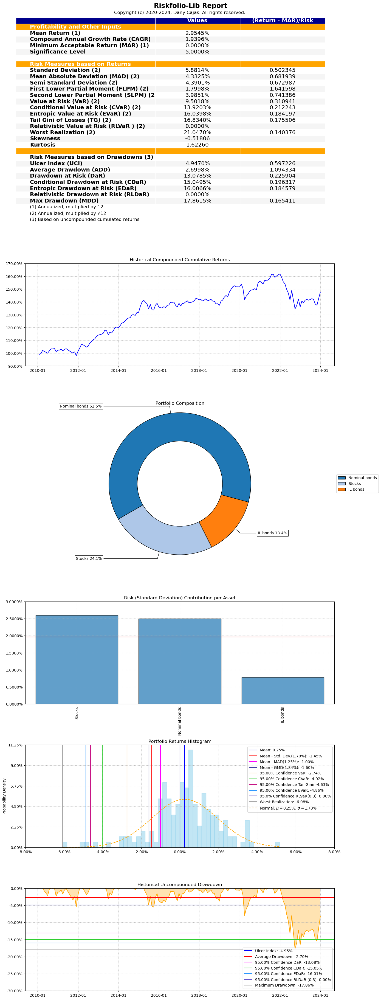

In [70]:
returns=df2_m.iloc[:]
port = rp.Portfolio(returns)

method_mu='hist' # Method to estimate expected returns based on historical data.
method_cov='hist' # Method to estimate covariance matrix based on historical data.

port.assets_stats(method_mu=method_mu, method_cov=method_cov, d=0.94)

model='Classic'
rm = 'MV' # Risk measure
obj = 'Sharpe' # Objective function, MinRisk, MaxRet, Utility or Sharpe
hist = True
rf = 0 # Risk free rate
l = 0 # Risk aversion factor

w = port.optimization(model=model, rm=rm, obj=obj, rf=rf, l=l, hist=hist)
mv_ilb_20 = w

display(w.T)

returns = port.returns

ax = rp.jupyter_report(returns,
                       w,
                       rm=rm,
                       rf=rf,
                       alpha=0.05,
                       others=1,
                       nrow=25,
                       height=6,
                       width=14,
                       t_factor=12,
                       ini_days=21,
                       days_per_year=252,
                       bins=50,
                       solver='ECOS',
                       )

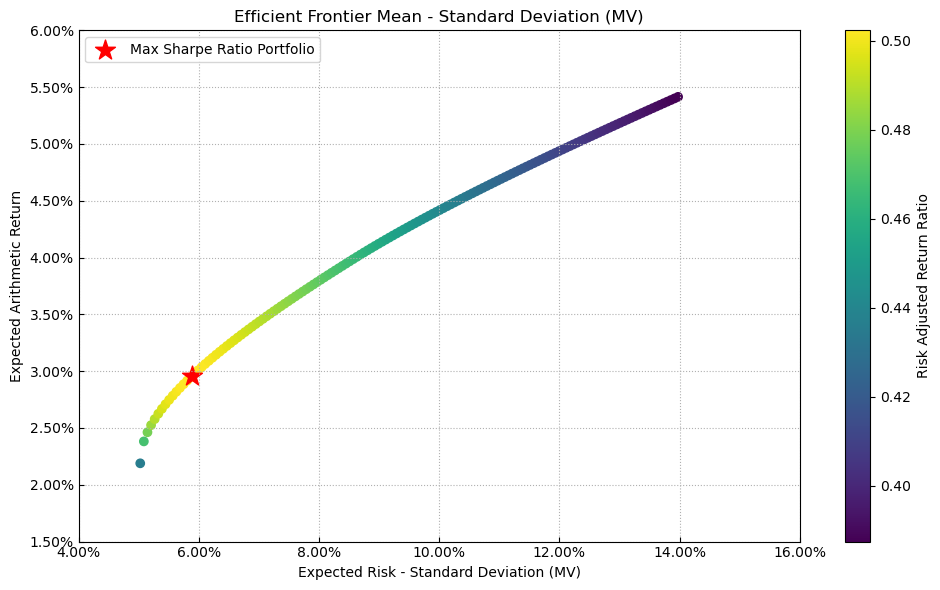

In [72]:
points = 150 # Number of points of the frontier

frontier = port.efficient_frontier(model=model, rm=rm, points=points, rf=rf, hist=hist)

label = 'Max Sharpe Ratio Portfolio' # Title of point
mu = port.mu # Expected returns
cov = port.cov # Covariance matrix
returns = port.returns # Returns of the assets

ax = rp.plot_frontier(w_frontier=frontier, mu=mu, cov=cov, returns=returns, rm=rm,
                      rf=rf, alpha=0.05, cmap='viridis', w=w, label=label,
                      marker='*', s=15, c='r', height=6, width=10, ax=None, t_factor=12)

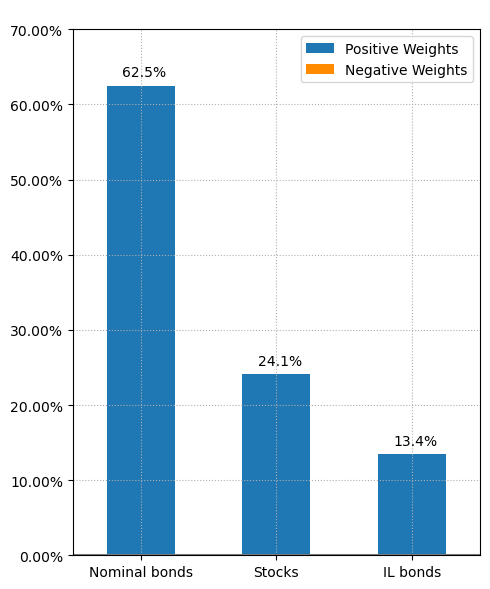

In [74]:
ax = rp.plot_bar(w,
                 title=' ',
                 kind="v",
                 others=1,
                 nrow=25,
                 height=6,
                 width=5,
                 cpos='tab:blue',
                 ax=None)

# Optimal portfolio composition over time

In [77]:
model='Classic'  # Could be Classic (historical), BL (Black Litterman) or FM (Factor Model)
rm = 'MV'  # Risk measure used, this time will be variance
obj = 'Sharpe'  # Objective function, MinRisk, MaxRet, Utility or Sharpe
hist = True  # Use historical scenarios for risk measures that depend on scenarios
rf = 0  # Risk free rate 
l = 0  # Risk aversion factor, only useful when obj is 'Utility'
method_mu='hist'  # Method to estimate expected returns based on historical data.
method_cov='hist'  # Method to estimate covariance matrix based on historical data.

weights_list = []

for m in range(73):
    port = rp.Portfolio(returns=df2_m.iloc[:96+m])

    port.assets_stats(method_mu=method_mu, method_cov=method_cov, d=0.94)

    w = port.optimization(model=model, rm=rm, obj=obj, rf=rf, l=l, hist=hist)
    
    # Convert the weights to a DataFrame and add the month index
    w_df = pd.DataFrame(w).T
    w_df.index = [96 + m]
    
    weights_list.append(w_df)

# Concatenate all the individual DataFrames into one
weights = pd.concat(weights_list)

date_range = pd.date_range(start='2017-12-01', periods=len(weights), freq='M')
weights.index = date_range

# Display the combined DataFrame
display(weights[20:])


,Stocks,Nominal bonds,IL bonds
2019-08-31,8.9746%,91.0254%,0.0000%
2019-09-30,9.9111%,90.0889%,0.0000%
2019-10-31,10.5169%,89.4831%,0.0000%
2019-11-30,11.4662%,88.5338%,0.0000%
2019-12-31,12.3316%,87.6684%,0.0000%
2020-01-31,11.8294%,88.1706%,0.0000%
2020-02-29,9.6011%,90.3989%,0.0000%
2020-03-31,4.4755%,95.5245%,0.0000%
2020-04-30,5.5637%,94.4363%,0.0000%
2020-05-31,6.1339%,93.8661%,0.0000%


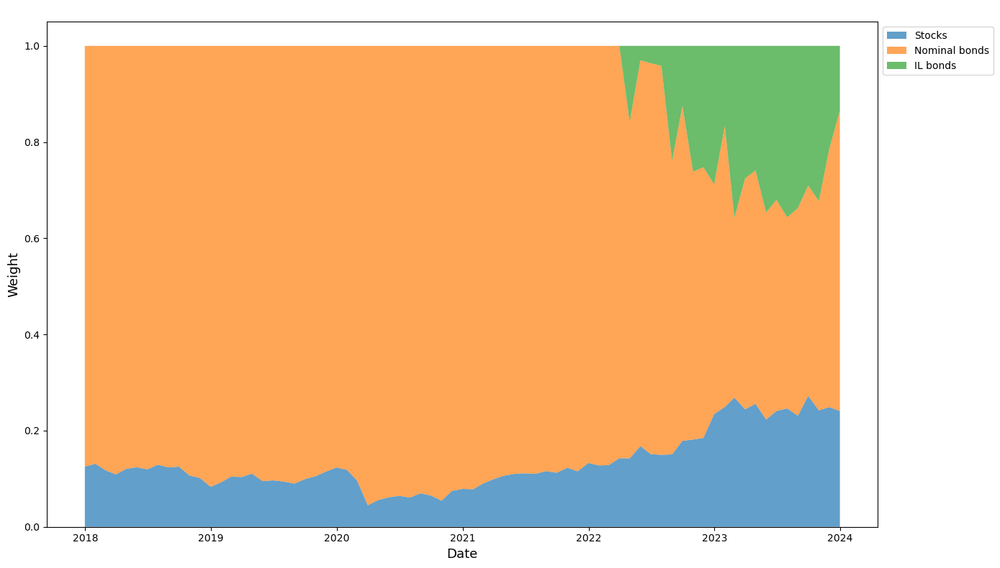

In [79]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
inflation = pd.read_csv("euinflation.csv")
# Assuming `weights` is the DataFrame with months as the index and asset weights as columns
# Display the DataFrame to verify its structure

# Plot the portfolio composition changes over time
plt.figure(figsize=(14, 8))
plt.stackplot(weights.index, weights.T, labels=weights.columns, alpha=0.7, cmap="tab20")

# Adding a legend and labels
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.title(' ')
plt.xlabel('Date',size=13)
plt.ylabel('Weight',size=13)
plt.grid(False)
plt.tight_layout()

# Show the plot
plt.show()


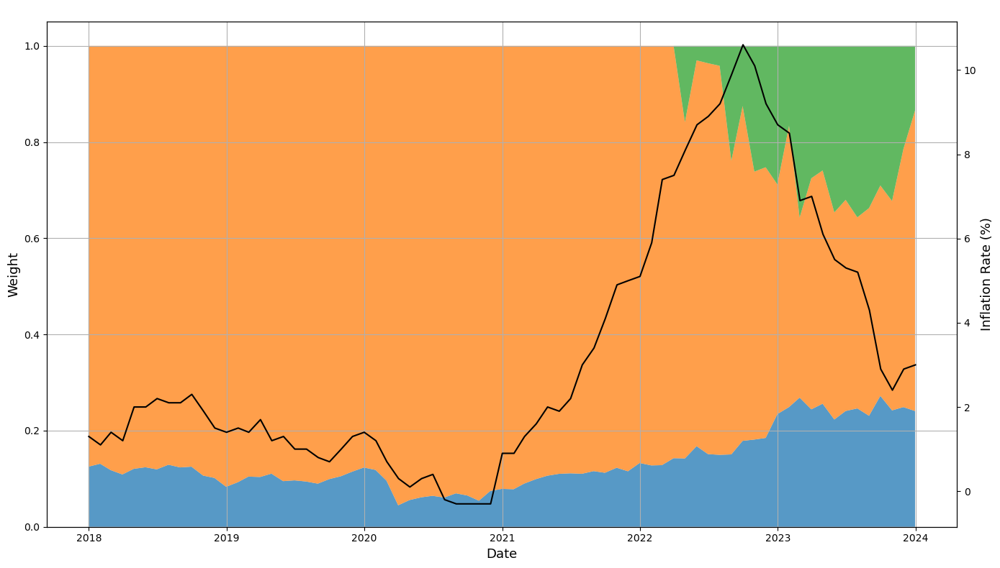

In [81]:
inflation = pd.read_csv("euinflation.csv")
inflation['date'] = pd.to_datetime(inflation['date'], format='%Y-%m')
inflation.set_index('date', inplace=True)
inflation.sort_index(inplace=True)

# Plot the portfolio composition changes over time
fig, ax1 = plt.subplots(figsize=(14, 8))

# Stack plot for portfolio composition
ax1.stackplot(weights.index, weights.T, labels=weights.columns, alpha=0.75, cmap="tab20")
ax1.set_xlabel('Date', size=13)
ax1.set_ylabel('Weight', size=13)
ax1.grid(True, )

# Create a secondary y-axis for the inflation data
ax2 = ax1.twinx()
ax2.plot(inflation.index, inflation['inflation'], color='black', linestyle='-', marker='', label='Inflation')
ax2.set_ylabel('Inflation Rate (%)', size=13)
#ax2.legend(loc='upper right', bbox_to_anchor=(1, 0.9))

# Adding title
plt.title(' ')

# Ensure the layout is tight so everything fits without overlap
plt.tight_layout()

# Show the plot
plt.show()

# Equally weighted portfolio

## Base portfolio

### 2018-2020

                                     CVXPY                                     
                                     v1.4.3                                    
(CVXPY) Jun 21 11:18:20 AM: Your problem has 396 variables, 4 constraints, and 0 parameters.
(CVXPY) Jun 21 11:18:20 AM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Jun 21 11:18:20 AM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Jun 21 11:18:20 AM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
(CVXPY) Jun 21 11:18:20 AM: Your problem is compiled with the CPP canonicalization backend.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Jun 21 11:18:20 AM: Compiling problem (target solver=MOSEK).
(C

/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:750: UserWarning: The figure layout has changed to tight
  fig.tight_layout()
/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:1324: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


                                     CVXPY                                     
                                     v1.4.3                                    
(CVXPY) Jun 21 11:18:21 AM: Your problem has 396 variables, 4 constraints, and 0 parameters.
(CVXPY) Jun 21 11:18:21 AM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Jun 21 11:18:21 AM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Jun 21 11:18:21 AM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
(CVXPY) Jun 21 11:18:21 AM: Your problem is compiled with the CPP canonicalization backend.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Jun 21 11:18:21 AM: Compiling problem (target solver=MOSEK).
(C

/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:1834: UserWarning: The figure layout has changed to tight
  fig.tight_layout()
/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:2225: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


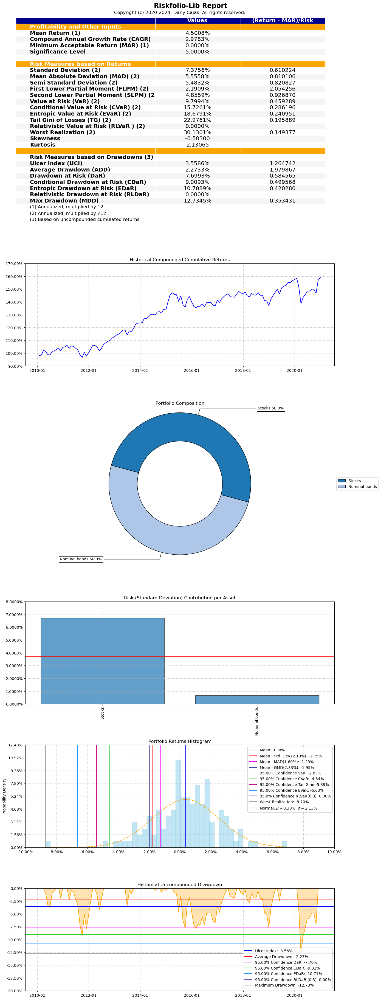

In [86]:
returns = df1_m.iloc[:132]
w = pd.DataFrame([0.5,0.5], index=['Stocks','Nominal bonds'], columns=["weights"])
ax = rp.jupyter_report(returns,
                       w,
                       rm=rm,
                       rf=0,
                       alpha=0.05,
                       others=1,
                       nrow=25,
                       height=6,
                       width=14,
                       t_factor=12,
                       ini_days=1,
                       days_per_year=252,
                       bins=50,
                       solver='ECOS',
                       )

### 2020-2023

                                     CVXPY                                     
                                     v1.4.3                                    
(CVXPY) Jun 21 11:18:35 AM: Your problem has 504 variables, 4 constraints, and 0 parameters.
(CVXPY) Jun 21 11:18:35 AM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Jun 21 11:18:35 AM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Jun 21 11:18:35 AM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
(CVXPY) Jun 21 11:18:35 AM: Your problem is compiled with the CPP canonicalization backend.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Jun 21 11:18:35 AM: Compiling problem (target solver=MOSEK).
(C

/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:750: UserWarning: The figure layout has changed to tight
  fig.tight_layout()
/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:1324: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


                                     CVXPY                                     
                                     v1.4.3                                    
(CVXPY) Jun 21 11:18:36 AM: Your problem has 504 variables, 4 constraints, and 0 parameters.
(CVXPY) Jun 21 11:18:36 AM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Jun 21 11:18:36 AM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Jun 21 11:18:36 AM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
(CVXPY) Jun 21 11:18:36 AM: Your problem is compiled with the CPP canonicalization backend.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Jun 21 11:18:36 AM: Compiling problem (target solver=MOSEK).
(C

/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:1834: UserWarning: The figure layout has changed to tight
  fig.tight_layout()
/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:2225: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


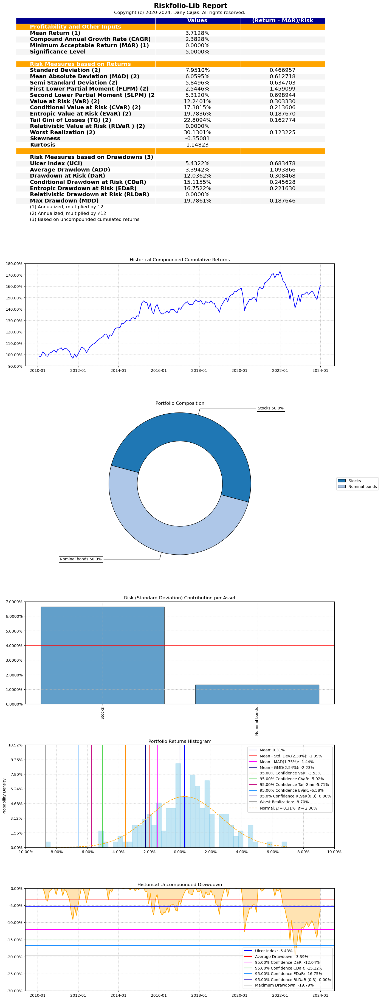

In [91]:
returns=df1_m.iloc[:]
w = pd.DataFrame([0.5,0.5], index=['Stocks','Nominal bonds'], columns=["weights"])
ax = rp.jupyter_report(returns,
                       w,
                       rm=rm,
                       rf=rf,
                       alpha=0.05,
                       others=1,
                       nrow=25,
                       height=6,
                       width=14,
                       t_factor=12,
                       ini_days=1,
                       days_per_year=252,
                       bins=50,
                       solver='ECOS',
                       )

## Base + ILB

### 2018-2020

                                     CVXPY                                     
                                     v1.4.3                                    
(CVXPY) Jun 21 11:18:38 AM: Your problem has 396 variables, 4 constraints, and 0 parameters.
(CVXPY) Jun 21 11:18:38 AM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Jun 21 11:18:38 AM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Jun 21 11:18:38 AM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
(CVXPY) Jun 21 11:18:38 AM: Your problem is compiled with the CPP canonicalization backend.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Jun 21 11:18:38 AM: Compiling problem (target solver=MOSEK).
(C

/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:750: UserWarning: The figure layout has changed to tight
  fig.tight_layout()
/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:1324: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


                                     CVXPY                                     
                                     v1.4.3                                    
(CVXPY) Jun 21 11:18:38 AM: Your problem has 396 variables, 4 constraints, and 0 parameters.
(CVXPY) Jun 21 11:18:38 AM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Jun 21 11:18:38 AM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Jun 21 11:18:38 AM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
(CVXPY) Jun 21 11:18:38 AM: Your problem is compiled with the CPP canonicalization backend.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Jun 21 11:18:38 AM: Compiling problem (target solver=MOSEK).
(C

/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:1834: UserWarning: The figure layout has changed to tight
  fig.tight_layout()
/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:2225: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


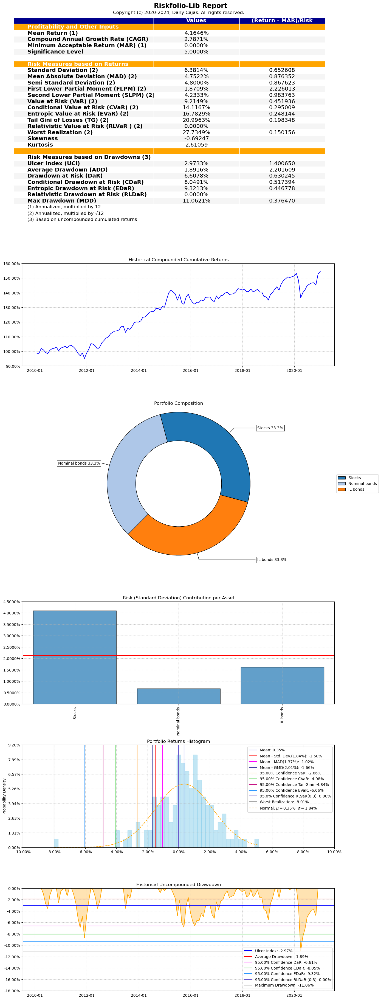

In [95]:
returns = df2_m.iloc[:132]
w = pd.DataFrame([0.333333,0.333333,0.333333], index=['Stocks','Nominal bonds','IL bonds'], columns=["weights"])
ax = rp.jupyter_report(returns,
                       w,
                       rm=rm,
                       rf=0,
                       alpha=0.05,
                       others=1,
                       nrow=25,
                       height=6,
                       width=14,
                       t_factor=12,
                       ini_days=1,
                       days_per_year=252,
                       bins=50,
                       solver='ECOS',
                       )

### 2020-2023

                                     CVXPY                                     
                                     v1.4.3                                    
(CVXPY) Jun 21 11:18:42 AM: Your problem has 504 variables, 4 constraints, and 0 parameters.
(CVXPY) Jun 21 11:18:42 AM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Jun 21 11:18:42 AM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Jun 21 11:18:42 AM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
(CVXPY) Jun 21 11:18:42 AM: Your problem is compiled with the CPP canonicalization backend.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Jun 21 11:18:42 AM: Compiling problem (target solver=MOSEK).
(C

/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:750: UserWarning: The figure layout has changed to tight
  fig.tight_layout()
/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:1324: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


                                     CVXPY                                     
                                     v1.4.3                                    
(CVXPY) Jun 21 11:18:42 AM: Your problem has 504 variables, 4 constraints, and 0 parameters.
(CVXPY) Jun 21 11:18:42 AM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Jun 21 11:18:42 AM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Jun 21 11:18:42 AM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
(CVXPY) Jun 21 11:18:42 AM: Your problem is compiled with the CPP canonicalization backend.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Jun 21 11:18:42 AM: Compiling problem (target solver=MOSEK).
(C

/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:1834: UserWarning: The figure layout has changed to tight
  fig.tight_layout()
/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:2225: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


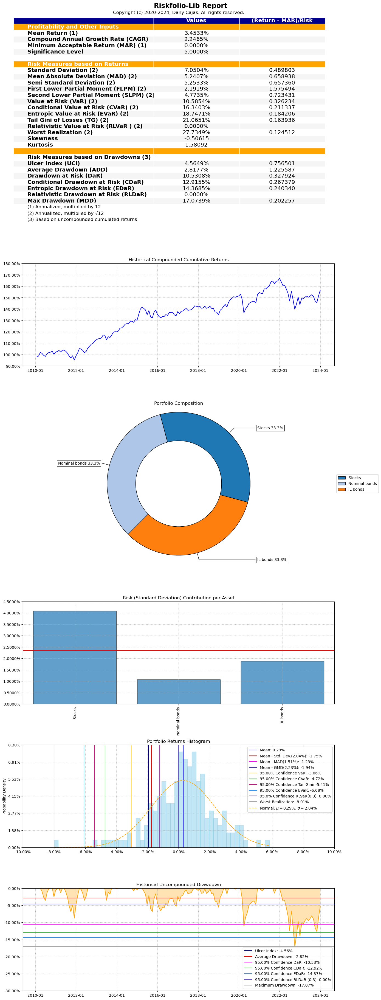

In [98]:
# MUST BE RAN AFTER ANY OPTIMIZATION ON DF1_M SO THE WEIGHTS ARRAY MATCHES SHAPE
returns = df2_m.iloc[:]
w = pd.DataFrame([0.333333,0.333333,0.333333], index=['Stocks','Nominal bonds','IL bonds'], columns=["weights"])
ax = rp.jupyter_report(returns,
                       w,
                       rm=rm,
                       rf=0,
                       alpha=0.05,
                       others=1,
                       nrow=25,
                       height=6,
                       width=14,
                       t_factor=12,
                       ini_days=1,
                       days_per_year=252,
                       bins=50,
                       solver='ECOS',
                       )

# Risk Parity

## Base Portfolio

### 2018-2020

,Stocks,Nominal bonds
weights,22.2943%,77.7057%


                                     CVXPY                                     
                                     v1.4.3                                    
(CVXPY) Jun 21 11:18:45 AM: Your problem has 396 variables, 4 constraints, and 0 parameters.
(CVXPY) Jun 21 11:18:45 AM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Jun 21 11:18:45 AM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Jun 21 11:18:45 AM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
(CVXPY) Jun 21 11:18:45 AM: Your problem is compiled with the CPP canonicalization backend.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Jun 21 11:18:45 AM: Compiling problem (target solver=MOSEK).
(C

/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:750: UserWarning: The figure layout has changed to tight
  fig.tight_layout()
/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:1324: UserWarning: The figure layout has changed to tight
  fig.tight_layout()
/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:1834: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


                                     CVXPY                                     
                                     v1.4.3                                    
(CVXPY) Jun 21 11:18:46 AM: Your problem has 396 variables, 4 constraints, and 0 parameters.
(CVXPY) Jun 21 11:18:46 AM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Jun 21 11:18:46 AM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Jun 21 11:18:46 AM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
(CVXPY) Jun 21 11:18:46 AM: Your problem is compiled with the CPP canonicalization backend.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Jun 21 11:18:46 AM: Compiling problem (target solver=MOSEK).
(C

/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:2225: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


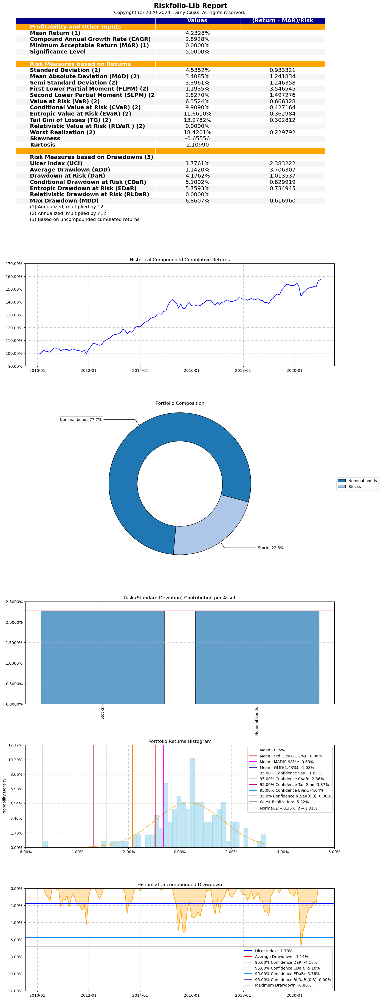

In [103]:
returns=df1_m.iloc[:132]
port = rp.Portfolio(returns)

method_mu='hist' 
method_cov='hist' 

port.assets_stats(method_mu=method_mu, method_cov=method_cov, d=0.94)

model='Classic' 
rm = 'MV'
obj = 'Sharpe'
hist = True
rf = 0
l = 0

b = None # Constraints

w = port.rp_optimization(model=model, rm=rm, rf=rf, b=b, hist=hist)
rp_base_18 = w

display(w.T)

ax = rp.jupyter_report(returns,
                       w,
                       rm=rm,
                       rf=rf,
                       alpha=0.05,
                       others=1,
                       nrow=25,
                       height=6,
                       width=14,
                       t_factor=12,
                       ini_days=21,
                       days_per_year=252,
                       bins=50,
                       solver='ECOS',
                       )

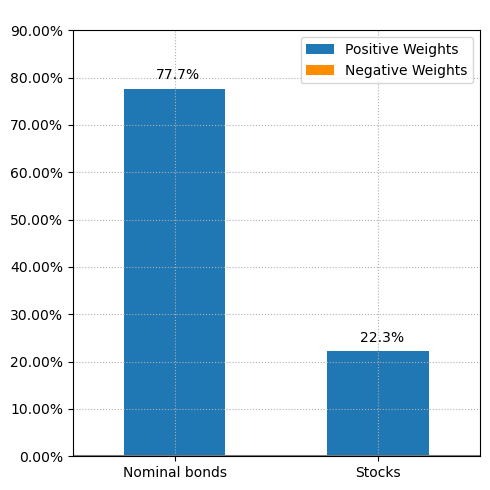

In [104]:
ax = rp.plot_bar(w,
                 title=' ',
                 kind="v",
                 others=1,
                 nrow=25,
                 height=5,
                 width=5,
                 cpos='tab:blue',
                 ax=None)

### 2021-2023

,Stocks,Nominal bonds
weights,26.6503%,73.3497%


                                     CVXPY                                     
                                     v1.4.3                                    
(CVXPY) Jun 21 11:18:49 AM: Your problem has 504 variables, 4 constraints, and 0 parameters.
(CVXPY) Jun 21 11:18:49 AM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Jun 21 11:18:49 AM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Jun 21 11:18:49 AM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
(CVXPY) Jun 21 11:18:49 AM: Your problem is compiled with the CPP canonicalization backend.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Jun 21 11:18:49 AM: Compiling problem (target solver=MOSEK).
(C

/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:750: UserWarning: The figure layout has changed to tight
  fig.tight_layout()
/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:1324: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


                                     CVXPY                                     
                                     v1.4.3                                    
(CVXPY) Jun 21 11:18:49 AM: Your problem has 504 variables, 4 constraints, and 0 parameters.
(CVXPY) Jun 21 11:18:49 AM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Jun 21 11:18:49 AM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Jun 21 11:18:49 AM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
(CVXPY) Jun 21 11:18:49 AM: Your problem is compiled with the CPP canonicalization backend.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Jun 21 11:18:49 AM: Compiling problem (target solver=MOSEK).
(C

/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:1834: UserWarning: The figure layout has changed to tight
  fig.tight_layout()
/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:2225: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


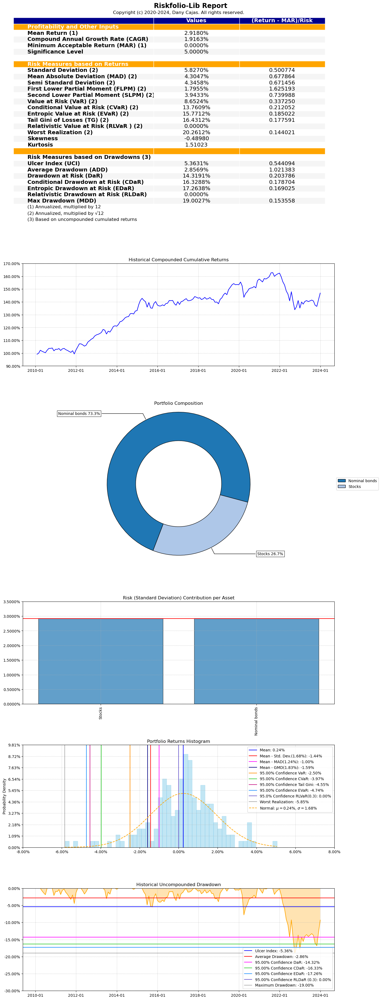

In [108]:
returns=df1_m.iloc[:]
port = rp.Portfolio(returns)

method_mu='hist'
method_cov='hist'

port.assets_stats(method_mu=method_mu, method_cov=method_cov, d=0.94)

model='Classic'
rm = 'MV'
obj = 'Sharpe'
hist = True
rf = 0
l = 0

b = None

w = port.rp_optimization(model=model, rm=rm, rf=rf, b=b, hist=hist)
rp_base_20 = w

display(w.T)

ax = rp.jupyter_report(returns,
                       w,
                       rm=rm,
                       rf=rf,
                       alpha=0.05,
                       others=1,
                       nrow=25,
                       height=6,
                       width=14,
                       t_factor=12,
                       ini_days=21,
                       days_per_year=252,
                       bins=50,
                       solver='ECOS',
                       )

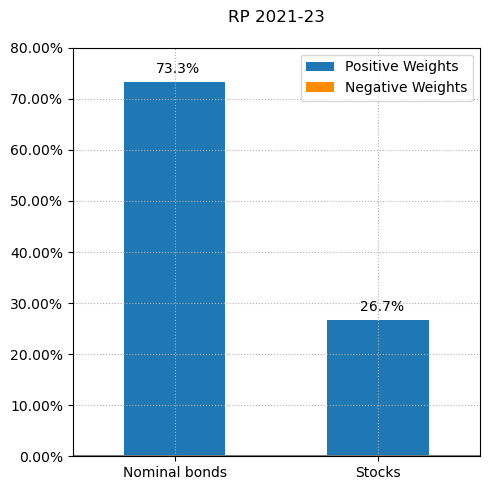

In [109]:
ax = rp.plot_bar(w,
                 title='RP 2021-23\n ',
                 kind="v",
                 others=1,
                 nrow=25,
                 height=5,
                 width=5,
                 cpos='tab:blue',
                 ax=None)

## Base + ILB

### 2018-2020

,Stocks,Nominal bonds,IL bonds
weights,17.1565%,53.7026%,29.1408%


                                     CVXPY                                     
                                     v1.4.3                                    
(CVXPY) Jun 21 11:18:53 AM: Your problem has 396 variables, 4 constraints, and 0 parameters.
(CVXPY) Jun 21 11:18:53 AM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Jun 21 11:18:53 AM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Jun 21 11:18:53 AM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
(CVXPY) Jun 21 11:18:53 AM: Your problem is compiled with the CPP canonicalization backend.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Jun 21 11:18:53 AM: Compiling problem (target solver=MOSEK).
(C

/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:750: UserWarning: The figure layout has changed to tight
  fig.tight_layout()
/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:1324: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


                                     CVXPY                                     
                                     v1.4.3                                    
(CVXPY) Jun 21 11:18:53 AM: Your problem has 396 variables, 4 constraints, and 0 parameters.
(CVXPY) Jun 21 11:18:53 AM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Jun 21 11:18:53 AM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Jun 21 11:18:53 AM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
(CVXPY) Jun 21 11:18:53 AM: Your problem is compiled with the CPP canonicalization backend.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Jun 21 11:18:53 AM: Compiling problem (target solver=MOSEK).
(C

/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:1834: UserWarning: The figure layout has changed to tight
  fig.tight_layout()
/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:2225: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


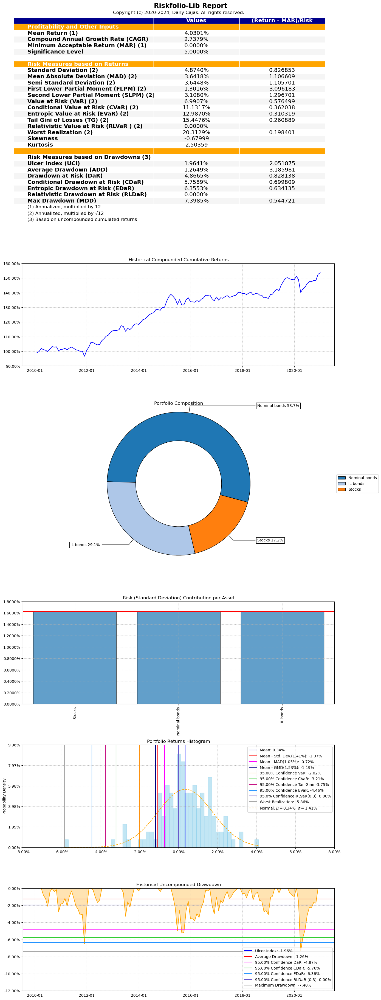

In [114]:
returns=df2_m.iloc[:132]
port = rp.Portfolio(returns)

method_mu='hist' 
method_cov='hist' 

port.assets_stats(method_mu=method_mu, method_cov=method_cov, d=0.94)

model='Classic' 
rm = 'MV'
obj = 'Sharpe'
hist = True
rf = 0
l = 0

b = None # Constraints

w = port.rp_optimization(model=model, rm=rm, rf=rf, b=b, hist=hist)
rp_ilb_18 = w

display(w.T)

ax = rp.jupyter_report(returns,
                       w,
                       rm=rm,
                       rf=rf,
                       alpha=0.05,
                       others=1,
                       nrow=25,
                       height=6,
                       width=14,
                       t_factor=12,
                       ini_days=21,
                       days_per_year=252,
                       bins=50,
                       solver='ECOS',
                       )

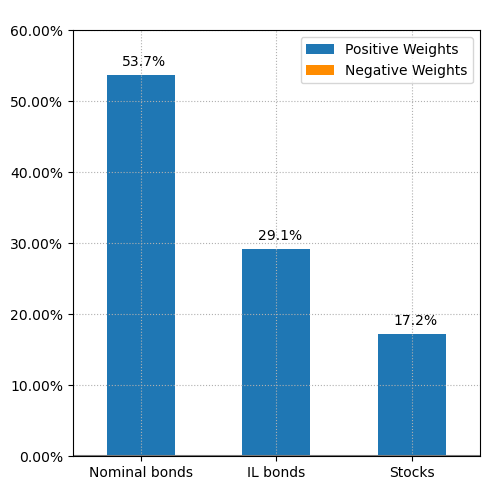

In [115]:
ax = rp.plot_bar(w,
                 title=' ',
                 kind="v",
                 others=1,
                 nrow=25,
                 height=5,
                 width=5,
                 cpos='tab:blue',
                 ax=None)

### 2021-2023

,Stocks,Nominal bonds,IL bonds
weights,19.3371%,48.6085%,32.0543%


                                     CVXPY                                     
                                     v1.4.3                                    
(CVXPY) Jun 21 11:18:56 AM: Your problem has 504 variables, 4 constraints, and 0 parameters.
(CVXPY) Jun 21 11:18:56 AM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Jun 21 11:18:56 AM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Jun 21 11:18:56 AM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
(CVXPY) Jun 21 11:18:56 AM: Your problem is compiled with the CPP canonicalization backend.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Jun 21 11:18:56 AM: Compiling problem (target solver=MOSEK).
(C

/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:750: UserWarning: The figure layout has changed to tight
  fig.tight_layout()
/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:1324: UserWarning: The figure layout has changed to tight
  fig.tight_layout()
/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:1834: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


                                     CVXPY                                     
                                     v1.4.3                                    
(CVXPY) Jun 21 11:18:57 AM: Your problem has 504 variables, 4 constraints, and 0 parameters.
(CVXPY) Jun 21 11:18:57 AM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Jun 21 11:18:57 AM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Jun 21 11:18:57 AM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
(CVXPY) Jun 21 11:18:57 AM: Your problem is compiled with the CPP canonicalization backend.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Jun 21 11:18:57 AM: Compiling problem (target solver=MOSEK).
(C

/opt/anaconda3/lib/python3.11/site-packages/riskfolio/src/PlotFunctions.py:2225: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


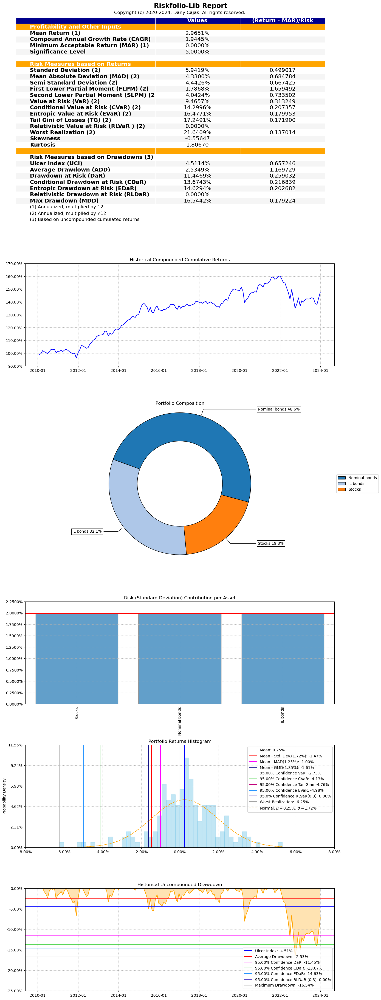

In [119]:
returns=df2_m.iloc[:]
port = rp.Portfolio(returns)

method_mu='hist' 
method_cov='hist' 

port.assets_stats(method_mu=method_mu, method_cov=method_cov, d=0.94)

model='Classic' 
rm = 'MV'
obj = 'Sharpe'
hist = True
rf = 0
l = 0

b = None # Constraints

w = port.rp_optimization(model=model, rm=rm, rf=rf, b=b, hist=hist)
rp_ilb_21 = w

display(w.T)

ax = rp.jupyter_report(returns,
                       w,
                       rm=rm,
                       rf=rf,
                       alpha=0.05,
                       others=1,
                       nrow=25,
                       height=6,
                       width=14,
                       t_factor=12,
                       ini_days=21,
                       days_per_year=252,
                       bins=50,
                       solver='ECOS',
                       )

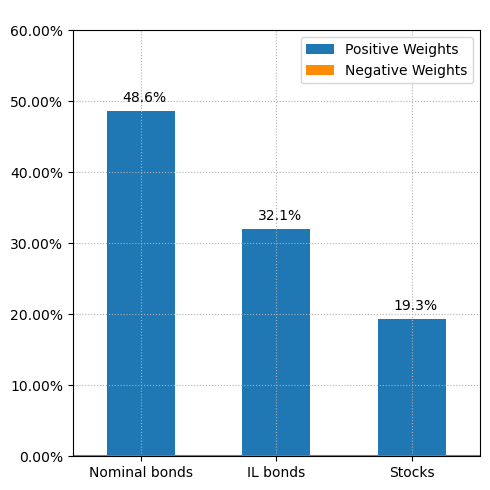

In [120]:
ax = rp.plot_bar(w,
                 title=' ',
                 kind="v",
                 others=1,
                 nrow=25,
                 height=5,
                 width=5,
                 cpos='tab:blue',
                 ax=None)

<BarContainer object of 2 artists>

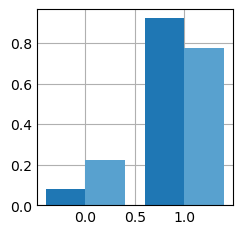

In [139]:


# importing package 
import matplotlib.pyplot as plt 
import numpy as np 
  
# create data 
x = np.arange(2) 
y1 = mv_base_18['weights'].tolist() 
y2 = rp_base_18['weights'].tolist() 
width = 0.4
  
# plot data in grouped manner of bar type 
plt.bar(x-0.2, y1, width) 
plt.bar(x+0.2, y2, width) 


In [ ]:
#Counting trading days
print("Trading days per year:")
for year in range(2018,2024):
    print(str(year) + " " + str(len(desc.loc[str(year)])))
print("Average trading days: 251")